In [2]:
import pandas as pd
import scanpy as sc
import anndata
import numpy as np
import loompy
import seaborn as sns

In [3]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=120)

scanpy==1.5.1 anndata==0.7.3 umap==0.4.4 numpy==1.18.4 scipy==1.4.1 pandas==1.0.4 scikit-learn==0.23.1 statsmodels==0.11.1 python-igraph==0.8.2 leidenalg==0.8.0


In [4]:
adata=sc.read_loom('mese_with_embedding.loom', obs_names='_index', var_names='GeneName', obsm_names ={'X_tsne':['embed1', 'embed2']})
adata

/Users/paulaklavina/opt/anaconda3/envs/singlecell/lib/python3.7/site-packages/loompy/loom_validator.py:48: H5pyDeprecationWarning: The default file mode will change to 'r' (read-only) in h5py 3.0. To suppress this warning, pass the mode you need to h5py.File(), or set the global default h5.get_config().default_file_mode, or set the environment variable H5PY_DEFAULT_READONLY=1. Available modes are: 'r', 'r+', 'w', 'w-'/'x', 'a'. See the docs for details.
  with h5py.File(path) as f:


AnnData object with n_obs × n_vars = 5632 × 18072
    obs: 'DC', 'Gender', 'Mousename', 'Plate', 'SortType', 'Time [days]', 'Timepoint', 'Treatment', 'Well', 'cellRoughSubtype', 'cellSubtype', 'cellType', 'coverage', 'doublet', 'embed_endo_1', 'embed_endo_2', 'fastq', 'number_of_genes_1plusreads'
    var: 'Chromosome', 'Gene stable ID', 'Strand', '_index', 'missing_info', 'n_geneIds'
    obsm: 'X_tsne'

In [14]:
adata.obs

,DC,Gender,Mousename,Plate,SortType,Time [days],Timepoint,Treatment,Well,cellRoughSubtype,cellSubtype,cellType,coverage,doublet,embed_endo_1,embed_endo_2,fastq,number_of_genes_1plusreads,is_ASM
F_P7_normal_mesench_1_DC20_A1,DC20,F,FP7,1.0,mesench,7,P7,normal,A1,,Airway SMC,mesenchymal,1175669.0,0,0.0,0.0,DC20/Cornfield_FP7mesench1_A1,6602.0,no_lateASM
F_P7_normal_mesench_1_DC20_K8,DC20,F,FP7,1.0,mesench,7,P7,normal,K8,,Airway SMC,mesenchymal,1118790.0,0,0.0,0.0,DC20/Cornfield_FP7mesench1_K8,5946.0,no_lateASM
F_P7_normal_mesench_2_DC20_L3,DC20,F,FP7,2.0,mesench,7,P7,normal,L3,,Early postnatal myofibroblast,mesenchymal,937739.0,0,0.0,0.0,DC20/Cornfield_FP7mesench2_L3,2505.0,no_lateASM
F_P7_normal_mesench_1_DC20_B3,DC20,F,FP7,1.0,mesench,7,P7,normal,B3,,Airway SMC,mesenchymal,1501364.0,0,0.0,0.0,DC20/Cornfield_FP7mesench1_B3,7587.0,no_lateASM
F_P7_normal_mesench_1_DC20_J23,DC20,F,FP7,1.0,mesench,7,P7,normal,J23,,Col13a1+ matrix fibroblast,mesenchymal,414305.0,0,0.0,0.0,DC20/Cornfield_FP7mesench1_J23,2556.0,no_lateASM
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
M_P7_hyperoxia_mesench_1_DC33_P10,DC33,M,MP7hyperoxia,1.0,mesench,7,P7,hyperoxia,P10,,Col13a1+ matrix fibroblast,mesenchymal,1896069.0,0,0.0,0.0,DC33/Cornfield_Mhyperoxiamesench1_P10,6750.0,no_lateASM
M_P7_hyperoxia_mesench_1_DC33_K8,DC33,M,MP7hyperoxia,1.0,mesench,7,P7,hyperoxia,K8,,Col13a1+ matrix fibroblast,mesenchymal,708443.0,0,0.0,0.0,DC33/Cornfield_Mhyperoxiamesench1_K8,5468.0,no_lateASM
M_P7_hyperoxia_mesench_2_DC33_N22,DC33,M,MP7hyperoxia,2.0,mesench,7,P7,hyperoxia,N22,,Col13a1+ matrix fibroblast,mesenchymal,413716.0,0,0.0,0.0,DC33/Cornfield_Mhyperoxiamesench2_N22,6834.0,no_lateASM
M_P7_hyperoxia_mesench_2_DC33_D15,DC33,M,MP7hyperoxia,2.0,mesench,7,P7,hyperoxia,D15,,Col14a1+ fibroblast,mesenchymal,1525757.0,0,0.0,0.0,DC33/Cornfield_Mhyperoxiamesench2_D15,9120.0,no_lateASM


In [4]:
import ks_2samp

In [5]:
ks_2samp.compare?

In [6]:
import partition

In [7]:
partition.split?

In [5]:
sc.pp.normalize_total(adata, target_sum=1e6)

normalizing counts per cell
    finished (0:00:00)


In [6]:
adata.X=adata.X.todense()

### Comparing late ASMCs with the rest of the cells at P21

In [63]:
adata.obs['is_lateASM']='no_lateASM'
idx=adata.obs['cellSubtype'].isin(['Late postnatal ASMC'])
adata.obs.loc[idx, 'is_lateASM']='yes_lateASM'
lateASM_vs_all=partition.split(adata, 'is_lateASM')
lateASM_vs_all

{'no_lateASM': View of AnnData object with n_obs × n_vars = 5519 × 18072
     obs: 'DC', 'Gender', 'Mousename', 'Plate', 'SortType', 'Time [days]', 'Timepoint', 'Treatment', 'Well', 'cellRoughSubtype', 'cellSubtype', 'cellType', 'coverage', 'doublet', 'embed_endo_1', 'embed_endo_2', 'fastq', 'number_of_genes_1plusreads', 'is_lateASM'
     var: 'Chromosome', 'Gene stable ID', 'Strand', '_index', 'missing_info', 'n_geneIds'
     uns: 'log1p'
     obsm: 'X_tsne',
 'yes_lateASM': View of AnnData object with n_obs × n_vars = 113 × 18072
     obs: 'DC', 'Gender', 'Mousename', 'Plate', 'SortType', 'Time [days]', 'Timepoint', 'Treatment', 'Well', 'cellRoughSubtype', 'cellSubtype', 'cellType', 'coverage', 'doublet', 'embed_endo_1', 'embed_endo_2', 'fastq', 'number_of_genes_1plusreads', 'is_lateASM'
     var: 'Chromosome', 'Gene stable ID', 'Strand', '_index', 'missing_info', 'n_geneIds'
     uns: 'log1p'
     obsm: 'X_tsne'}

In [82]:
adata_treatment=partition.split(adata, 'Treatment')
adata_normal=adata_treatment['normal']
adata_timepoint=partition.split(adata_normal, 'Timepoint')
adata_P21=adata_timepoint['P21']
lateASM_vs_all_P21=partition.split(adata_P21, 'is_lateASM')

In [65]:
genelist_lateASM_vs_all_P21=ks_2samp.compare(lateASM_vs_all_P21['no_lateASM'][:100], lateASM_vs_all_P21['yes_lateASM'][:100])

In [43]:
idx=genelist_lateASM_vs_all_P21['statistic']>0.5
genelist_lateASM_vs_all_P21=genelist_lateASM_vs_all_P21.loc[idx]
genelist_lateASM_vs_all_P21=genelist_lateASM_vs_all_P21.sort_values(by='log2_fold_change', ascending=False)
genelist_lateASM_vs_all_P21[:20].to_excel('Late ASM vs rest.xlsx')
genelist_lateASM_vs_all_P21[:100]

,statistic,pvalue,avg1,avg2,log2_fold_change
Sgcg,0.65,3.108080e-20,0.000000,9.602420,9.602420
Ccdc3,0.57,2.458151e-15,1.826702,7.967896,6.141194
Hhip,0.84,3.736177e-36,6.617099,12.400681,5.783582
Cdh4,0.62,2.708443e-18,3.710255,9.421355,5.711101
Cyp2e1,0.67,1.334180e-21,4.373229,10.057672,5.684443
Mustn1,0.93,5.044580e-47,6.999206,11.750887,4.751681
Igfbp5,0.83,4.043862e-35,6.637516,11.131051,4.493535
Rgs2,0.76,1.418662e-28,7.727638,12.111715,4.384078
Gja1,0.60,4.528308e-17,4.562645,8.842800,4.280155
Ece1,0.62,2.708443e-18,5.375191,9.539250,4.164060


#### For pathway analysis

In [74]:
idx=genelist_lateASM_vs_all_P21['statistic']>0.3
genelist_lateASM_vs_all_P21=genelist_lateASM_vs_all_P21.loc[idx]
genelist_lateASM_vs_all_P21=genelist_lateASM_vs_all_P21.sort_values(by='log2_fold_change', ascending=False)
idx_up1=genelist_lateASM_vs_all_P21['log2_fold_change']>0
genes_up1=genelist_lateASM_vs_all_P21.loc[idx_up1]
','.join(genes_up1[:100].index)
#len(genelist_lateASM_vs_all_P21)
#genes_up1

'Mustn1,Igfbp5,Cyp2e1,Sgcg,Cdh4,Hhip,Ednrb,Ccdc3,Pdlim3,Enpp2,Efnb2,Acta2,Gja1,Grem2,Fgf18,Ece1,Cdkn1a,Lhfpl2,Aspn,Rgs2,Lgr6,Myc,P2ry14,Map1b,Myocd,Pde4b,Thbs1,6330403K07Rik,P4ha3,Enpp1,Thbs2,Arid5a,Lum,Sema3c,Gem,Tgfbi,Kazald1,Agt,Csmd1,Clu,Hlf,Mapk4,Pcsk5,Rbfox1,Atf3,Gadd45g,Plxna4,Megf10,Rhou,Mt1,Olfml2b,Atp6v0e2,Maob,Ntn4,Cd9,Rnf122,Lcorl,Ctsc,Igfbp3,Crip1,Adamts1,Prnp,Mt2,Errfi1,Sacs,Irf1,Tagln,Wnt5a,Pamr1,Cd9-ps,Tmem176a,Tmem176b,Serpine2,Nr4a2,Myl9,Igf1,Ier3,Fosl2,Cebpd,Ets2,Zfp36l1-ps,Spon2,Sdc4,Crispld2,Nfkbia,Lpar1,Junb,Fos,Vmn1r-ps27,Ecm2,Egr1,Nr4a1,Mgst1,Ier2,Lrrc61,Tsc22d3,Btg1,Crip2,Btg2,Lgals1'

In [168]:
idx=genelist_lateASM_vs_all_P21['statistic']>0.3
genelist_lateASM_vs_all_P21=genelist_lateASM_vs_all_P21.loc[idx]
genelist_lateASM_vs_all_P21=genelist_lateASM_vs_all_P21.sort_values(by='log2_fold_change', ascending=False)
idx_down1=genelist_lateASM_vs_all_P21['log2_fold_change']<0
genes_down1=genelist_lateASM_vs_all_P21.loc[idx_down1]
#genes_down[:100]
','.join(genes_down1[:100].index)
#len(genelist_lateASM_vs_all_P21)

'Col3a1,Ywhab,Ubxn4,Syne2,Mxd4,Eif5,Cbx5,Dnaja2,Extl3,Atp1b3,Tmem263,Saraf,Atraid,Cope,Cst3,Lgals3bp,Dcaf8,Copg1,Tmbim6,Shisa5,Golga7,Ddx39b,Rdx,Rnh1,Sept11,Phlda1,Tubb4b,Tcf4,Ubald1,Kdelr3,Atg3,Vcp-rs,Fam114a1,Rnaset2a,Pcyox1,Adk,Tsc22d1,Slc35b1,Xist,Dag1,P4ha1,Ap2a2,Nfat5,Hoxa5,Smarca2,Col6a1,Gbf1,Tbrg1,H13,Lhfp,Ctnnb1,Thra,Snhg18,Fbn1,Ddx24,Tbck,Ifngr1,Gns,Gpm6b,Copa,Aldh2,Rnaset2b,Surf4,Oxct1,Sh3bgrl,Scp2,Adgra2,Serping1,C1rb,Pdcd6,Man1a2,Rin2,Nisch,Sh3glb1,Gng11,Copb2,Xbp1,Serpinh1,Runx1t1,Isoc1,Chd4,Rock2,Pja1,Nr2f2,Arhgef17,Manf,Pde9a,Bmp4,Cblb,Slc25a17,Emp2,Selenop,Ogn,Mmp2,Sirt2,Ccng2,Slc43a3,Tmem39a,2310022B05Rik,Idh1'

In [24]:
idx=genelist_lateASM_vs_all_P21['statistic']>0.5
genelist_lateASM_vs_all_P21=genelist_lateASM_vs_all_P21.loc[idx]
genelist_lateASM_vs_all_P21=genelist_lateASM_vs_all_P21.sort_values(by='log2_fold_change', ascending=True)
genelist_lateASM_vs_all_P21[:20].to_excel('Late ASM vs rest down.xlsx')
genelist_lateASM_vs_all_P21[:20]

,statistic,pvalue,avg1,avg2,log2_fold_change
Hsd11b1,0.66,6.553180e-21,10.534410,0.021200,-10.513209
Inmt,0.62,2.708443e-18,13.076613,3.669210,-9.407404
Dpep1,0.59,1.767145e-16,9.388103,0.000000,-9.388103
Cfh,0.71,1.587524e-24,9.593802,0.506199,-9.087604
Tmem119,0.58,6.689905e-16,8.774207,0.015447,-8.758759
Npnt,0.54,1.024570e-13,10.689291,2.182261,-8.507030
Vcam1,0.52,1.070076e-12,8.681235,0.371940,-8.309295
Slc1a5,0.58,6.689905e-16,7.662728,0.039416,-7.623312
Gpc3,0.72,2.676640e-25,9.687243,2.169402,-7.517840
Cdh11,0.60,4.528308e-17,8.748583,2.279728,-6.468855


### Comparing late ASMCs with P1+P7 ASMCs

In [80]:
adata_celltype=partition.split(adata_normal, 'cellSubtype')

In [27]:
adata_celltype

{'Airway SMC': View of AnnData object with n_obs × n_vars = 206 × 18072
     obs: 'DC', 'Gender', 'Mousename', 'Plate', 'SortType', 'Time [days]', 'Timepoint', 'Treatment', 'Well', 'cellRoughSubtype', 'cellSubtype', 'cellType', 'coverage', 'doublet', 'embed_endo_1', 'embed_endo_2', 'fastq', 'number_of_genes_1plusreads', 'is_ASM', 'Normal', 'is_lateASM'
     var: 'Chromosome', 'Gene stable ID', 'Strand', '_index', 'missing_info', 'n_geneIds'
     obsm: 'X_tsne',
 'Early postnatal myofibroblast': View of AnnData object with n_obs × n_vars = 417 × 18072
     obs: 'DC', 'Gender', 'Mousename', 'Plate', 'SortType', 'Time [days]', 'Timepoint', 'Treatment', 'Well', 'cellRoughSubtype', 'cellSubtype', 'cellType', 'coverage', 'doublet', 'embed_endo_1', 'embed_endo_2', 'fastq', 'number_of_genes_1plusreads', 'is_ASM', 'Normal', 'is_lateASM'
     var: 'Chromosome', 'Gene stable ID', 'Strand', '_index', 'missing_info', 'n_geneIds'
     obsm: 'X_tsne',
 'Col13a1+ matrix fibroblast': View of AnnData ob

In [115]:
genelist_lateASM_vs_ASM=ks_2samp.compare(adata_celltype['Airway SMC'][:100], adata_celltype['Late postnatal ASMC'][:100])

In [32]:
idx=genelist_lateASM_vs_ASM['statistic']>0.5
genelist_lateASM_vs_ASM=genelist_lateASM_vs_ASM.loc[idx]
genelist_lateASM_vs_ASM=genelist_lateASM_vs_ASM.sort_values(by='log2_fold_change', ascending=False)
genelist_lateASM_vs_ASM[:20].to_excel('Late ASM vs ASM.xlsx')
genelist_lateASM_vs_ASM[:20]

,statistic,pvalue,avg1,avg2,log2_fold_change
Lum,0.69,4.962294e-23,0.037056,11.095666,11.058610
Mt1,0.63,6.314162e-19,5.467409,12.022432,6.555023
Cyp2e1,0.67,1.334180e-21,3.599778,10.057672,6.457893
Pcolce2,0.68,2.620711e-22,3.922092,9.637538,5.715446
Pi15,0.53,3.357101e-13,2.580774,7.765230,5.184457
Igfbp3,0.58,6.689905e-16,5.448890,10.629498,5.180607
Fmo2,0.72,2.676640e-25,5.744410,10.588027,4.843617
Mgp,0.86,2.605877e-38,9.450541,13.738432,4.287891
Cdkn1a,0.72,2.676640e-25,7.161990,11.361305,4.199316
Gsn,0.84,3.736177e-36,8.414462,12.383542,3.969080


In [194]:
idx=genelist_lateASM_vs_ASM['statistic']>0.2
genelist_lateASM_vs_ASM=genelist_lateASM_vs_ASM.loc[idx]
genelist_lateASM_vs_ASM=genelist_lateASM_vs_ASM.sort_values(by='log2_fold_change', ascending=False)
idx_up2=genelist_lateASM_vs_ASM['log2_fold_change']>0
genes_up2=genelist_lateASM_vs_ASM.loc[idx_up2]
','.join(genes_up2[:100].index)
#genes_up2
#len(genes_up)

'Lum,Cyp2e1,Fmo2,Pcolce2,Mt1,Cdkn1a,Prelp,Dcn,Igfbp3,Mgst1,Pi15,Mt2,Mgp,Icam1,Errfi1,Igfbp5,Gpx3,Slc10a6,H2-K1,Maob,Xdh,Angpt2,Selenop,Tnfsf13b,Neat1,Lpl,Gstm2-ps1,H2-D1,Gstm1,Bmp5,Ndrg2,C4b,Cebpd,Myc,Fam180a,1200007C13Rik,Bcl6,Osmr,Tnxb,Atf3,Retreg1,Fas,Nr1d1,Gadd45b,Grem2,Kcns3,Clu,Birc3,Ecm2,Stc1,Cebpb,Kazald1,Mettl7a1,Mapk4,Gsn,Plscr4,Tmem176a,Rab38,Abi3bp,Aldh1a1,Lgr5,Nampt,Bhlhe40,Adamts17,Sat1,Lgals3,Colec12,Cxcl1,Isg20,Sbno2,Ctsc,1500015O10Rik,Tmcc3,C1ra,Klf9,Lepr,Igfbp7,Klf2,Steap3,Nfkbiz,Vmn1r-ps27,Tspo,Gfpt2,Spock2,S1pr3,Dock4,Pappa,Ogn,Irf1,Sgcg,Pim3,Csrnp1,Hcn1,Tsc22d3,Bcl3,Serping1,Myd88,Ets2,Icosl,Selenbp1'

In [31]:
idx=genelist_lateASM_vs_ASM['statistic']>0.5
genelist_lateASM_vs_ASM=genelist_lateASM_vs_ASM.loc[idx]
genelist_lateASM_vs_ASM=genelist_lateASM_vs_ASM.sort_values(by='log2_fold_change', ascending=True)
genelist_lateASM_vs_ASM[:20].to_excel('Late ASM vs ASM down.xlsx')
genelist_lateASM_vs_ASM[:20]

,statistic,pvalue,avg1,avg2,log2_fold_change
Postn,0.78,2.485563e-30,10.489584,0.648984,-9.840600
Lrrc15,0.62,2.708443e-18,8.750444,0.179879,-8.570565
Fbn2,0.56,8.771130e-15,6.445256,0.178875,-6.266382
Cnn1,0.81,3.938154e-33,10.781615,4.562497,-6.219119
Nnat,0.72,2.676640e-25,8.604488,2.840204,-5.764284
Ctxn1,0.59,1.767145e-16,7.145273,2.180453,-4.964820
Mex3a,0.52,1.070076e-12,6.276413,2.105827,-4.170586
Actg2,0.82,4.111260e-34,11.725332,7.691625,-4.033708
Tnc,0.78,2.485563e-30,10.539442,6.688049,-3.851393
Klhl23,0.53,3.357101e-13,7.387645,3.580892,-3.806754


In [117]:
idx=genelist_lateASM_vs_ASM['statistic']>0.2
genelist_lateASM_vs_ASM=genelist_lateASM_vs_ASM.loc[idx]
genelist_lateASM_vs_ASM=genelist_lateASM_vs_ASM.sort_values(by='log2_fold_change', ascending=True)
idx_down2=genelist_lateASM_vs_ASM['log2_fold_change']<0
genes_down2=genelist_lateASM_vs_ASM.loc[idx_down2]
#','.join(genes_down2[:100].index)
genes_down2
#len(genes_up)

,statistic,pvalue,avg1,avg2,log2_fold_change
Postn,0.78,2.485563e-30,1.398245,0.059376,-1.338868
Cnn1,0.81,3.938154e-33,1.475472,0.173888,-1.301584
Nnat,0.72,2.676640e-25,1.272853,0.099401,-1.173452
Lrrc15,0.62,2.708443e-18,1.123786,0.018593,-1.105193
Fn1,0.73,4.332134e-26,1.326584,0.230677,-1.095907
...,...,...,...,...,...
Tuba1b,0.24,6.134033e-03,1.270561,1.261382,-0.009180
Itm2b,0.43,1.115168e-08,1.587573,1.579963,-0.007610
Lamp2,0.25,3.729492e-03,1.265894,1.260097,-0.005797
Mcl1,0.22,1.557713e-02,1.154861,1.153356,-0.001505


### Comparing P1+P7 ASMs with rest

In [75]:
adata.obs['is_ASM']='no_ASM'
idx=adata.obs['cellSubtype'].isin(['Airway SMC'])
adata.obs.loc[idx, 'is_ASM']='yes_ASM'
ASM_vs_all=partition.split(adata, 'is_ASM')
ASM_vs_all

{'yes_ASM': View of AnnData object with n_obs × n_vars = 286 × 18072
     obs: 'DC', 'Gender', 'Mousename', 'Plate', 'SortType', 'Time [days]', 'Timepoint', 'Treatment', 'Well', 'cellRoughSubtype', 'cellSubtype', 'cellType', 'coverage', 'doublet', 'embed_endo_1', 'embed_endo_2', 'fastq', 'number_of_genes_1plusreads', 'is_lateASM', 'is_ASM'
     var: 'Chromosome', 'Gene stable ID', 'Strand', '_index', 'missing_info', 'n_geneIds'
     uns: 'log1p'
     obsm: 'X_tsne',
 'no_ASM': View of AnnData object with n_obs × n_vars = 5346 × 18072
     obs: 'DC', 'Gender', 'Mousename', 'Plate', 'SortType', 'Time [days]', 'Timepoint', 'Treatment', 'Well', 'cellRoughSubtype', 'cellSubtype', 'cellType', 'coverage', 'doublet', 'embed_endo_1', 'embed_endo_2', 'fastq', 'number_of_genes_1plusreads', 'is_lateASM', 'is_ASM'
     var: 'Chromosome', 'Gene stable ID', 'Strand', '_index', 'missing_info', 'n_geneIds'
     uns: 'log1p'
     obsm: 'X_tsne'}

In [78]:
adata.obs['is_P1+P7']='no_P1+P7'
idx=adata.obs['Timepoint'].isin(['P1', 'P7'])
adata.obs.loc[idx, 'is_P1+P7']='yes_P1+P7'
P1_P7=partition.split(adata, 'is_P1+P7')
P1_P7

{'yes_P1+P7': View of AnnData object with n_obs × n_vars = 3560 × 18072
     obs: 'DC', 'Gender', 'Mousename', 'Plate', 'SortType', 'Time [days]', 'Timepoint', 'Treatment', 'Well', 'cellRoughSubtype', 'cellSubtype', 'cellType', 'coverage', 'doublet', 'embed_endo_1', 'embed_endo_2', 'fastq', 'number_of_genes_1plusreads', 'is_lateASM', 'is_ASM', 'is_P1+P7'
     var: 'Chromosome', 'Gene stable ID', 'Strand', '_index', 'missing_info', 'n_geneIds'
     uns: 'log1p'
     obsm: 'X_tsne',
 'no_P1+P7': View of AnnData object with n_obs × n_vars = 2072 × 18072
     obs: 'DC', 'Gender', 'Mousename', 'Plate', 'SortType', 'Time [days]', 'Timepoint', 'Treatment', 'Well', 'cellRoughSubtype', 'cellSubtype', 'cellType', 'coverage', 'doublet', 'embed_endo_1', 'embed_endo_2', 'fastq', 'number_of_genes_1plusreads', 'is_lateASM', 'is_ASM', 'is_P1+P7'
     var: 'Chromosome', 'Gene stable ID', 'Strand', '_index', 'missing_info', 'n_geneIds'
     uns: 'log1p'
     obsm: 'X_tsne'}

In [83]:
adata_P1P7=partition.split(adata_normal, 'is_P1+P7')
adata_P1P7
adata_P1P7yes=adata_P1P7['yes_P1+P7']
ASM_vs_all_P1_P7=partition.split(adata_P1P7yes, 'is_ASM')
ASM_vs_all_P1_P7

{'yes_ASM': View of AnnData object with n_obs × n_vars = 200 × 18072
     obs: 'DC', 'Gender', 'Mousename', 'Plate', 'SortType', 'Time [days]', 'Timepoint', 'Treatment', 'Well', 'cellRoughSubtype', 'cellSubtype', 'cellType', 'coverage', 'doublet', 'embed_endo_1', 'embed_endo_2', 'fastq', 'number_of_genes_1plusreads', 'is_lateASM', 'is_ASM', 'is_P1+P7'
     var: 'Chromosome', 'Gene stable ID', 'Strand', '_index', 'missing_info', 'n_geneIds'
     uns: 'log1p'
     obsm: 'X_tsne',
 'no_ASM': View of AnnData object with n_obs × n_vars = 2237 × 18072
     obs: 'DC', 'Gender', 'Mousename', 'Plate', 'SortType', 'Time [days]', 'Timepoint', 'Treatment', 'Well', 'cellRoughSubtype', 'cellSubtype', 'cellType', 'coverage', 'doublet', 'embed_endo_1', 'embed_endo_2', 'fastq', 'number_of_genes_1plusreads', 'is_lateASM', 'is_ASM', 'is_P1+P7'
     var: 'Chromosome', 'Gene stable ID', 'Strand', '_index', 'missing_info', 'n_geneIds'
     uns: 'log1p'
     obsm: 'X_tsne'}

In [84]:
genelist_ASM_vs_all_P1_P7=ks_2samp.compare(ASM_vs_all_P1_P7['no_ASM'][:100], ASM_vs_all_P1_P7['yes_ASM'][:100])

In [111]:
idx=genelist_ASM_vs_all_P1_P7['statistic']>0.5
genelist_ASM_vs_all_P1_P7=genelist_ASM_vs_all_P1_P7.loc[idx]
genelist_ASM_vs_all_P1_P7=genelist_ASM_vs_all_P1_P7.sort_values(by='log2_fold_change', ascending=False)
genelist_ASM_vs_all_P1_P7[:20].to_excel('ASM vs rest.xlsx')
genelist_ASM_vs_all_P1_P7[:20]

,statistic,pvalue,avg1,avg2,log2_fold_change
Scx,0.64,1.424536e-19,0.000000,7.747449,7.747449
Crispld2,0.55,3.040659e-14,1.168679,7.609891,6.441213
Cdh4,0.67,1.334180e-21,2.225085,8.137312,5.912227
Enpp2,0.76,1.418662e-28,4.365453,9.686996,5.321542
Lrrc15,0.59,1.767145e-16,3.853402,8.751050,4.897648
Kcnma1,0.52,1.070076e-12,2.472279,7.216104,4.743825
Gja1,0.70,9.048888e-24,4.719540,9.284060,4.564519
Aspn,0.84,3.736177e-36,8.414646,12.527527,4.112881
Lgr6,0.73,4.332134e-26,4.257511,8.280042,4.022531
Cnn1,0.72,2.676640e-25,6.722863,10.679979,3.957116


In [88]:
idx=genelist_ASM_vs_all_P1_P7['statistic']>0.3
genelist_ASM_vs_all_P1_P7=genelist_ASM_vs_all_P1_P7.loc[idx]
genelist_ASM_vs_all_P1_P7=genelist_ASM_vs_all_P1_P7.sort_values(by='log2_fold_change', ascending=False)
idx_up3=genelist_ASM_vs_all_P1_P7['log2_fold_change']>0
genes_up3=genelist_ASM_vs_all_P1_P7.loc[idx_up3]
','.join(genes_up3[:100].index)
#genes_up3
#len(genes_up3)

'Enpp2,Scx,Cnn1,Myocd,Pamr1,Lgr6,Cdh4,Gja1,Lrrc15,Kcnj8,Aspn,Col12a1,Enpp1,Crispld2,Ptgis,Kcnma1,Net1,Pdlim3,Actg2,Cd9,Ssc5d,Fhl2,Sema3c,Tgfbi,Agt,Ece1,Fgf18,Adgrg2,Myh11,Sntg2,Des,Wnt9a,Thbs3,Rasl11b,Gem,Por,Angptl2,Ifitm10,Egln3,Lmod1,Prss12,Lsp1,Map1b,Postn,Pappa2,Rgs5,Ntn1,Pde1a,Dst,Loxl2,Mustn1,Filip1l,Asb2,Olfml2b,Rgs6,Met,Sorbs1,Stk38l,Creb5,Rrad,Magi1,Nrxn3,Hhip,Zfp827,Lpar1,Pcdh7,Id4,Nfil3,Lhfpl2,Egfem1,Tjp2,Ier3,Sgcg,Plpp3,Cgnl1,Nfatc1,Svil,Ednrb,Grem2,Plxna4,Cacna2d3,Gpc4,Synpo2,Podn,Dnm3os,Dusp10,Prnp,Tmtc1,Trp53inp1,Syt11,Tspan18,Lmcd1,Pde10a,P2ry14,6330403K07Rik,Mn1,Samd4,Sox9,Pcsk5,Zmiz1'

In [110]:
idx=genelist_ASM_vs_all_P1_P7['statistic']>0.5
genelist_ASM_vs_all_P1_P7=genelist_ASM_vs_all_P1_P7.loc[idx]
genelist_ASM_vs_all_P1_P7=genelist_ASM_vs_all_P1_P7.sort_values(by='log2_fold_change', ascending=True)
genelist_ASM_vs_all_P1_P7[:20].to_excel('ASM vs rest down.xlsx')
genelist_ASM_vs_all_P1_P7[:20]

,statistic,pvalue,avg1,avg2,log2_fold_change
Adh1,0.59,1.767145e-16,12.346815,3.863529,-8.483286
Tcf21,0.56,8.771130e-15,8.809293,1.829056,-6.980237
Cd34,0.53,3.357101e-13,8.964387,4.602568,-4.361819
Sept4,0.57,2.458151e-15,9.991015,6.244046,-3.746969
Cdh11,0.52,1.070076e-12,9.324955,5.856866,-3.468089
Rbp1,0.51,3.319419e-12,9.557151,6.660052,-2.897099
Tmsb10,0.61,1.125046e-17,10.053397,8.763166,-1.290231
Meg3,0.51,3.319419e-12,1.104336,2.269378,1.165042
Postn,0.55,3.040659e-14,9.313998,10.486238,1.172240
Adgrg2,0.62,2.708443e-18,7.327209,8.531994,1.204785


In [188]:
idx=genelist_ASM_vs_all_P1_P7['statistic']>0.3
genelist_ASM_vs_all_P1_P7=genelist_ASM_vs_all_P1_P7.loc[idx]
genelist_ASM_vs_all_P1_P7=genelist_ASM_vs_all_P1_P7.sort_values(by='log2_fold_change', ascending=True)
idx_down3=genelist_ASM_vs_all_P1_P7['log2_fold_change']<0
genes_down3=genelist_ASM_vs_all_P1_P7.loc[idx_down3]
','.join(genes_down3[:100].index)
#genes_down3
#len(genes_up3)

'Slc38a5,Meox2,Adh1,Vegfd,Enpep,6030408B16Rik,Tcf21,Cdkn2c,Cpm,Fgf10,Npnt,Limch1,Pcolce2,Spon1,Cacna1d,Vcam1,Gyg,Anxa1,Cd34,Maf,G0s2,Sept4,Lbh,Svep1,Cdh11,Gpc3,Ptprd,Kpna2,Chst2,Rap2a,Rbp1,Tmem204,Fbln5,Macf1,Pdlim2,Olfml3,Hmgn2,Stbd1,Fn1,Runx1t1,Ppp1r14a,Etv1,Gsn,Plxdc2,Serping1,Mfap4,Eif4ebp1,Mgp,Abi3bp,Pcolce,Phlda1,Nt5dc2,Igfbp7,Spry4,Sub1,Lamb1,Tmem176a,Hmgn2-ps1,Tmcc1,Ogn,Dbi,Gstm2,Ccnd2,Fhl1,Tmsb10,Slc25a5,Prdx5,Rnaset2a,Calm1,Ndufb7,Sec61b,Tagln2,Tomm6,Fth1,Ndufa4,Gnas,Nfib,Eef1a1,Rnd3'

### Comparing P1+P7 ASMs with ASM precursors

In [193]:
genelist_ASM_vs_preASM=ks_2samp.compare(adata_celltype['Embryonic MyoF and SMC precursors'][:100], adata_celltype['Airway SMC'][:100])

In [84]:
idx=genelist_ASM_vs_preASM['statistic']>0.5
genelist_ASM_vs_preASM=genelist_ASM_vs_preASM.loc[idx]
genelist_ASM_vs_preASM=genelist_ASM_vs_preASM.sort_values(by='log2_fold_change', ascending=False)
genelist_ASM_vs_preASM[:20].to_excel('ASM vs preASM.xlsx')
genelist_ASM_vs_preASM[:20]

,statistic,pvalue,avg1,avg2,log2_fold_change
Lrrc15,0.63,6.314162e-19,0.000000,8.750444,8.750444
Gja1,0.81,3.938154e-33,0.730221,9.255874,8.525653
Enpp1,0.74,6.722277e-27,0.147021,8.147122,8.000101
Aspn,0.92,1.217005e-45,6.065127,12.474116,6.408989
Ptgis,0.64,1.424536e-19,2.951160,9.042153,6.090993
Prss12,0.53,3.357101e-13,2.691595,8.083607,5.392012
Thbd,0.82,4.111260e-34,3.509089,8.779014,5.269924
Ntn1,0.66,6.553180e-21,2.578285,7.690424,5.112139
Thbs3,0.61,1.125046e-17,3.673838,8.560989,4.887152
Cnn1,0.74,6.722277e-27,5.979592,10.781615,4.802023


In [197]:
idx=genelist_ASM_vs_preASM['statistic']>0.3
genelist_ASM_vs_preASM=genelist_ASM_vs_preASM.loc[idx]
genelist_ASM_vs_preASM=genelist_ASM_vs_preASM.sort_values(by='log2_fold_change', ascending=False)
genes_up4=genelist_ASM_vs_preASM.loc[genelist_ASM_vs_preASM['log2_fold_change']>0]
','.join(genes_up4[:100].index)
#genes_up4
#len(genes_up4)

'Actc1,Lrrc15,Gja1,Enpp1,Itih5,Grem1,Ackr3,Aspn,Ptgis,Adam33,Ntrk3,Prss12,Thbd,Ntn1,Thbs3,Cnn1,Nox4,Tm4sf1,Pde1a,Mfap5,Prss35,Cd9,Tln2,Sod3,Mrgprf,Dpt,Col12a1,Lpar1,Fbln5,Pamr1,Pappa2,Bace2,Postn,Kcnma1,Rgs16,Hmcn1,Crip1,Id4,Ece1,Stk38l,Slco3a1,Cav1,Sgcg,Calhm5,Fn1,Dusp10,Tagln2,Rcan1,Kcnb2,Ssc5d,Ccdc80,Fbxl22,Gpc4,Loxl1,Grik4,Ccnd2,Plpp1,Des,Filip1l,Tppp3,Amotl1,Angptl2,Fnbp1,Hspg2,Heg1,Ptk2,Pfkp,Plpp3,Scx,Gas6,Nab1,Cpt1a,Actg2,Tgfb2,Podxl2,Sntg2,Tjp2,Fam213b,Sorbs1,Maml2,Ctgf,Olfml2b,Angptl4,Tgfb3,Fam102b,Ptgfrn,Cacna2d3,Atp2b4,Tanc2,Igfbp5,Mustn1,Adamts9,Mxra7,Cacna1c,Plat,Sspn,Inpp4a,Rnf130,Tubb4a,Slc35b4'

In [85]:
idx=genelist_ASM_vs_preASM['statistic']>0.5
genelist_ASM_vs_preASM=genelist_ASM_vs_preASM.loc[idx]
genelist_ASM_vs_preASM=genelist_ASM_vs_preASM.sort_values(by='log2_fold_change', ascending=True)
genelist_ASM_vs_preASM[:20].to_excel('ASM vs preASM down.xlsx')
genelist_ASM_vs_preASM[:20]

,statistic,pvalue,avg1,avg2,log2_fold_change
Crh,0.75,9.987382e-28,9.574646,0.000000,-9.574646
Scara5,0.76,1.418662e-28,9.281074,1.862340,-7.418733
Adh1,0.53,3.357101e-13,9.659773,2.612225,-7.047548
Piezo2,0.52,1.070076e-12,6.178586,0.954889,-5.223697
Fmo2,0.79,3.054882e-31,10.404796,5.744410,-4.660386
Lpin1,0.65,3.108080e-20,8.678042,4.081668,-4.596375
Hist1h1d,0.53,3.357101e-13,4.875890,0.310313,-4.565577
Pdgfra,0.77,1.923610e-29,9.693736,5.397687,-4.296049
H19,0.79,3.054882e-31,10.104708,5.837250,-4.267457
Fkbp5,0.58,6.689905e-16,7.142121,2.932103,-4.210018


In [201]:
idx=genelist_ASM_vs_preASM['statistic']>0.3
genelist_ASM_vs_preASM=genelist_ASM_vs_preASM.loc[idx]
genelist_ASM_vs_preASM=genelist_ASM_vs_preASM.sort_values(by='log2_fold_change', ascending=True)
genes_down4=genelist_ASM_vs_preASM.loc[genelist_ASM_vs_preASM['log2_fold_change']<0]
','.join(genes_down4[:100].index)
#genes_down4
#len(genes_down4)

'Crh,Scara5,Adh1,Xdh,Sult1a1,Cyp1b1,Piezo2,Fmo2,Lpin1,Hist1h1d,Pdgfra,H19,Fkbp5,Ddit4,Plxna2,Zbtb16,Slco2a1,Greb1,Igf2,Sulf2,Aldh1a1,Snai1,Tmem204,Narf,Ednrb,Cdc7,Bhlhe40,Hif3a,Mettl7a1,Fmo1,Hist2h2ac,Aldh2,Mgp,Hist1h1e,Otulinl,Tsc22d3,Fam213a,Klf15,Gucy1b1,Abca1,Penk,Dcun1d4,Hsp25-ps1,Sox5,Hspb1,Ndrg2,Ston1,Hist1h1c,Pim3,Txnip,St3gal4,Opcml,Errfi1,Bnip3,Cdc42ep4,Selenbp1,Jun,Lrp4,Rpa1,Socs3,Zadh2,Cd248,Ppp1r14a,H1f0,Mum1l1,Etv1,Adamtsl2,Ets2,Plekhf1,Nnat,Lox,Sms-ps,Epha3,Anp32a,Per1,Sgcb,AC160336.1,Ralgps2,Cebpd,Abi3bp,Lcorl,Sms,Gas7,Cdkn1a,Tshz1,Pcdh17,Glul,Sncaip,Cebpb,Fbln1,Acap2,Rerg,Glns-ps1,Klf9,Lamc1,Cldn1,Tbx3,Tbx5,B4galt1,Tmem176a'

### Comparing precursor ASMs with rest at E18.5

In [101]:
adata.obs['is_preASM']='no_preASM'
idx=adata.obs['cellSubtype'].isin(['Embryonic MyoF and SMC precursors'])
adata.obs.loc[idx, 'is_preASM']='yes_preASM'
preASM_vs_all=partition.split(adata, 'is_preASM')
preASM_vs_all

{'no_preASM': View of AnnData object with n_obs × n_vars = 5391 × 18072
     obs: 'DC', 'Gender', 'Mousename', 'Plate', 'SortType', 'Time [days]', 'Timepoint', 'Treatment', 'Well', 'cellRoughSubtype', 'cellSubtype', 'cellType', 'coverage', 'doublet', 'embed_endo_1', 'embed_endo_2', 'fastq', 'number_of_genes_1plusreads', 'is_ASM', 'Normal', 'is_lateASM', 'is_P1+P7', 'is_preASM'
     var: 'Chromosome', 'Gene stable ID', 'Strand', '_index', 'missing_info', 'n_geneIds'
     obsm: 'X_tsne',
 'yes_preASM': View of AnnData object with n_obs × n_vars = 241 × 18072
     obs: 'DC', 'Gender', 'Mousename', 'Plate', 'SortType', 'Time [days]', 'Timepoint', 'Treatment', 'Well', 'cellRoughSubtype', 'cellSubtype', 'cellType', 'coverage', 'doublet', 'embed_endo_1', 'embed_endo_2', 'fastq', 'number_of_genes_1plusreads', 'is_ASM', 'Normal', 'is_lateASM', 'is_P1+P7', 'is_preASM'
     var: 'Chromosome', 'Gene stable ID', 'Strand', '_index', 'missing_info', 'n_geneIds'
     obsm: 'X_tsne'}

In [104]:
adata_E185=adata_timepoint['E18.5']
preASM_vs_all_E185=partition.split(adata_E185, 'is_preASM')
preASM_vs_all_E185

{'no_preASM': View of AnnData object with n_obs × n_vars = 987 × 18072
     obs: 'DC', 'Gender', 'Mousename', 'Plate', 'SortType', 'Time [days]', 'Timepoint', 'Treatment', 'Well', 'cellRoughSubtype', 'cellSubtype', 'cellType', 'coverage', 'doublet', 'embed_endo_1', 'embed_endo_2', 'fastq', 'number_of_genes_1plusreads', 'is_ASM', 'Normal', 'is_lateASM', 'is_P1+P7', 'is_preASM'
     var: 'Chromosome', 'Gene stable ID', 'Strand', '_index', 'missing_info', 'n_geneIds'
     obsm: 'X_tsne',
 'yes_preASM': View of AnnData object with n_obs × n_vars = 224 × 18072
     obs: 'DC', 'Gender', 'Mousename', 'Plate', 'SortType', 'Time [days]', 'Timepoint', 'Treatment', 'Well', 'cellRoughSubtype', 'cellSubtype', 'cellType', 'coverage', 'doublet', 'embed_endo_1', 'embed_endo_2', 'fastq', 'number_of_genes_1plusreads', 'is_ASM', 'Normal', 'is_lateASM', 'is_P1+P7', 'is_preASM'
     var: 'Chromosome', 'Gene stable ID', 'Strand', '_index', 'missing_info', 'n_geneIds'
     obsm: 'X_tsne'}

In [202]:

genelist_preASM_vs_all_E185=ks_2samp.compare(preASM_vs_all_E185['no_preASM'][:100], preASM_vs_all_E185['yes_preASM'][:100])


In [108]:
idx=genelist_preASM_vs_all_E185['statistic']>0.5
genelist_preASM_vs_all_E185=genelist_preASM_vs_all_E185.loc[idx]
genelist_preASM_vs_all_E185=genelist_preASM_vs_all_E185.sort_values(by='log2_fold_change', ascending=False)
genelist_preASM_vs_all_E185[:20].to_excel('preASM vs rest.xlsx')
genelist_preASM_vs_all_E185[:20]

,statistic,pvalue,avg1,avg2,log2_fold_change
Crh,0.79,3.054882e-31,0.000000,9.643225,9.643225
Lgr6,0.78,2.485563e-30,0.040572,8.283540,8.242968
Enpp2,0.84,3.736177e-36,2.475761,10.270255,7.794495
Gdf10,0.57,2.458151e-15,0.039410,7.523095,7.483685
Sema3c,0.67,1.334180e-21,0.928560,8.409544,7.480984
Cdh4,0.54,1.024570e-13,0.519373,7.883672,7.364300
Pdlim3,0.79,3.054882e-31,3.275223,9.503921,6.228698
Trim67,0.65,3.108080e-20,2.124601,8.314627,6.190025
Enc1,0.65,3.108080e-20,1.833640,7.879521,6.045881
Fbxo32,0.51,3.319419e-12,1.699643,7.732355,6.032712


In [206]:
idx=genelist_preASM_vs_all_E185['statistic']>0.3
genelist_preASM_vs_all_E185=genelist_preASM_vs_all_E185.loc[idx]
genelist_preASM_vs_all_E185=genelist_preASM_vs_all_E185.sort_values(by='log2_fold_change', ascending=False)
genes_up5=genelist_preASM_vs_all_E185.loc[genelist_preASM_vs_all_E185['log2_fold_change']>0]
','.join(genes_up5[:100].index)
#genes_up5
#len(genes_up5)

'Crh,Lgr6,Enpp2,Gdf10,Sema3c,Cdh4,Fhod3,Rgs6,Pdlim3,Cacna1e,Trim67,Enc1,Fbxo32,Scara5,Crispld2,Tgfbi,Greb1,Fgf18,Ccdc3,Pik3ip1,Map1b,Net1,Smpx,Entpd1,Lmcd1,Grem2,Met,Mical2,Adamts14,Enpp5,Atf3,Cyp1b1,Agt,Actg2,Ndnf,Fhl2,Nrxn3,Spon2,Ednrb,Megf10,Egfem1,Cdkn1a,Mustn1,Slco2a1,Foxl1,Adcy7,P4ha3,Fndc1,Abr,Pcsk5,Angpt2,Wif1,Htra1,Igf1,Kank1,Bcl11a,Otulinl,Myh11,Tshz1,Hlf,Adgrg2,Cd200,Notum,Plxna2,Cdc7,Itga9,Sfrp2,Gem,Lpin1,Mllt3,Sema6d,Cd248,Sulf2,Fendrr,Col15a1,Csrp2,Myocd,Nnat,Ogfrl1,Ace,Plxna4,Sox5,F3,Cldn1,Ppp1r9a,Rpa1,Spry1,Lsp1,Arid5a,P2ry14,Hhip,Rgs5,Mettl7a1,Penk,H19,Spire1,Foxp2,Tmeff1,Pcdh17,Tagln'

In [109]:
idx=genelist_preASM_vs_all_E185['statistic']>0.5
genelist_preASM_vs_all_E185=genelist_preASM_vs_all_E185.loc[idx]
genelist_preASM_vs_all_E185=genelist_preASM_vs_all_E185.sort_values(by='log2_fold_change', ascending=True)
genelist_preASM_vs_all_E185[:20].to_excel('preASM vs rest down.xlsx')
genelist_preASM_vs_all_E185[:20]

,statistic,pvalue,avg1,avg2,log2_fold_change
Limch1,0.90,4.958890e-43,11.186678,1.278767,-9.907911
6030408B16Rik,0.77,1.923610e-29,9.032018,0.394445,-8.637572
Hsd11b1,0.82,4.111260e-34,11.031629,2.432425,-8.599203
Fgfr3,0.78,2.485563e-30,8.482699,0.297921,-8.184778
Pid1,0.51,3.319419e-12,7.576832,0.011808,-7.565024
Itga8,0.71,1.587524e-24,7.694479,0.205810,-7.488669
Npnt,0.76,1.418662e-28,8.362191,0.903467,-7.458724
Meox2,0.69,4.962294e-23,8.025496,0.686181,-7.339315
Brinp1,0.51,3.319419e-12,7.464418,0.138881,-7.325538
Tcf21,0.86,2.605877e-38,10.464464,3.527728,-6.936736


In [209]:
idx=genelist_preASM_vs_all_E185['statistic']>0.3
genelist_preASM_vs_all_E185=genelist_preASM_vs_all_E185.loc[idx]
genelist_preASM_vs_all_E185=genelist_preASM_vs_all_E185.sort_values(by='log2_fold_change', ascending=True)
genes_down5=genelist_preASM_vs_all_E185.loc[genelist_preASM_vs_all_E185['log2_fold_change']<0]
','.join(genes_down5[:100].index)
#genes_down5
#len(genes_up5)

'Limch1,6030408B16Rik,Hsd11b1,Slc36a2,Fgfr3,Pid1,Itga8,Npnt,Meox2,Brinp1,Ces1d,Tcf21,Camk1g,Fgf10,Vegfd,Bmp3,Cass4,Ccl11,Enpep,Mapt,Slc27a3,Cfh,Nrp2,Scn7a,Slc1a5,Angpt1,Gria3,Plekha6,1810010H24Rik,Fn1,Col13a1,Fras1,G0s2,Frrs1l,Itm2a,Spon1,Ablim3,Slc27a6,Dpt,Slc38a5,B430010I23Rik,Gyg,Kcna2,Col18a1,Mme,Slc10a6,Slc7a10,Mctp2,Cd24a,Cers6,Rin3,Nox4,Ncam1,Cped1,Alcam,Clec3b,Emp1,Dock4,Afap1l2,Tmem38b,Fbln5,Maf,Lbh,Pcolce2,Rreb1,Vcam1,Nckap5,Tagln2,Irf8,Macf1,Sh3bp5,E030013I19Rik,Srpx2,Dapk1,Ifitm1,Thbd,Dpep1,Scube2,Vldlr,Cacna1d,Mest,Ogn,Fgfr4,Wnt2,Cemip,Col25a1,Rasl12,Cited2,Bmper,Tnik,Rcan1,B4galt4,Gng11,Hivep3,Tmem119,Adh1,Rnf144a,Ccdc80,Kitl,Hmgn5'

### tsne plots for up/down-regulated genes

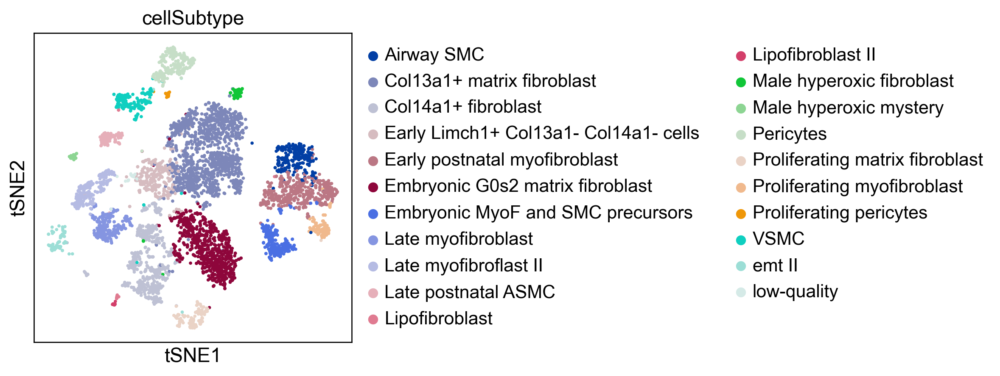

In [183]:
sc.pl.tsne(adata, color='cellSubtype', save='Cell subtypes.pdf')

#### Late ASMs

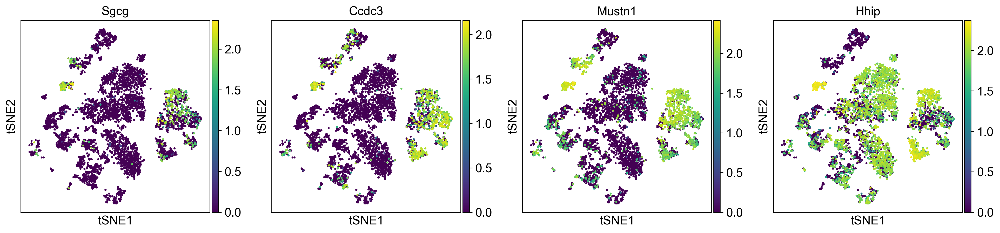

In [132]:

sc.pl.tsne(adata, color=['Sgcg', 'Ccdc3', 'Mustn1', 'Hhip'], save ='Late ASM up.png')

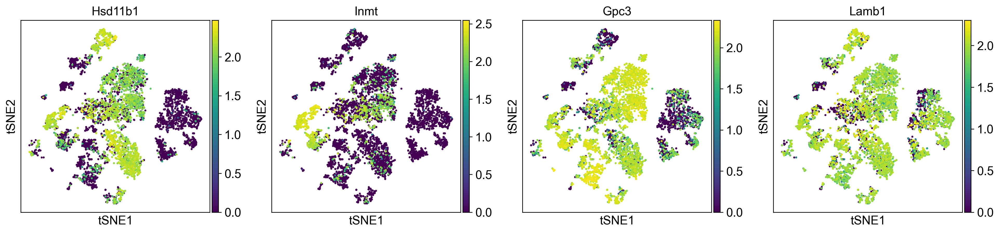

In [133]:
sc.pl.tsne(adata, color=['Hsd11b1', 'Inmt', 'Gpc3', 'Lamb1'], save='Late ASM down.png')

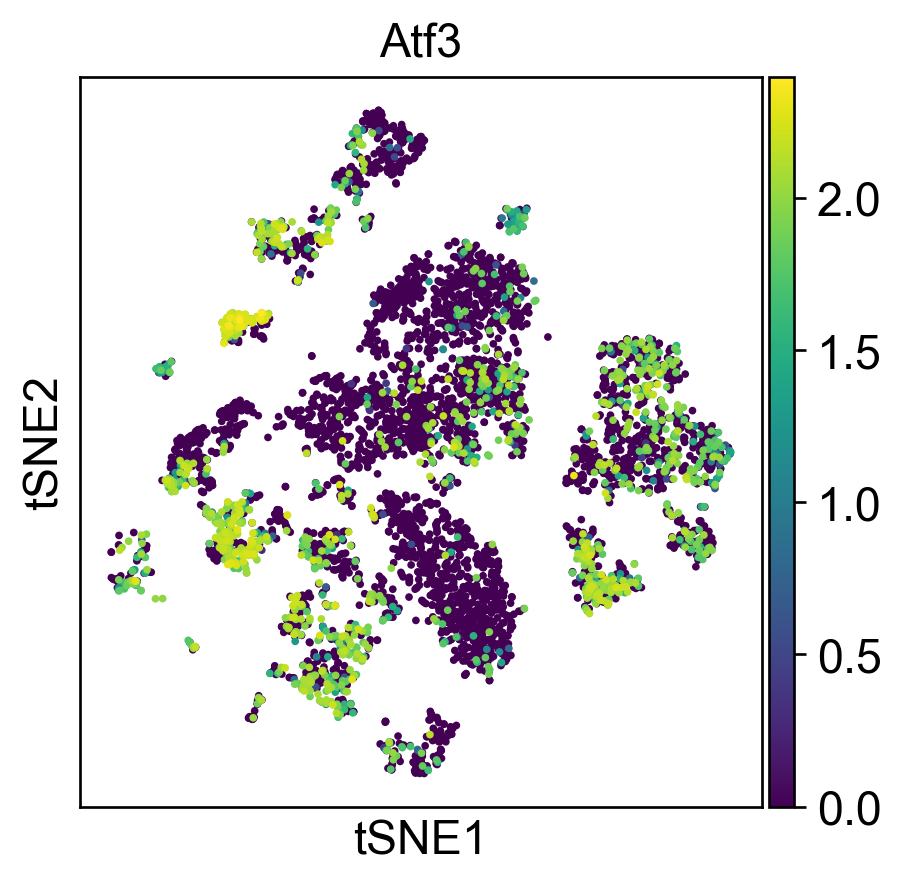

In [276]:
sc.pl.tsne(adata, color='Atf3')

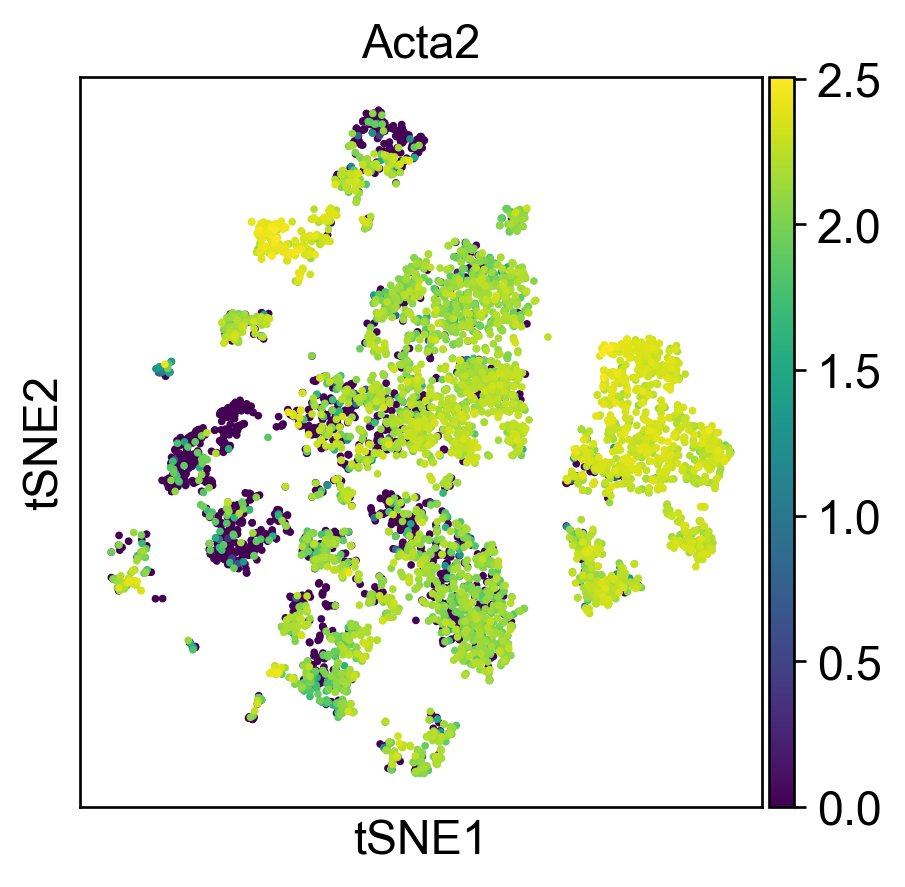

In [182]:
sc.pl.tsne(adata, color=['Acta2'], save='Acta2 expression.png')

#### Transition from late ASM to P1+P7 ASM

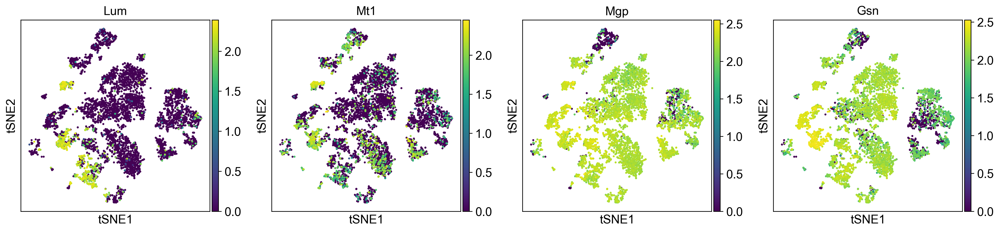

In [135]:
sc.pl.tsne(adata, color=['Lum', 'Mt1', 'Mgp', 'Gsn'], save='Late vs P1+P7 up.png')

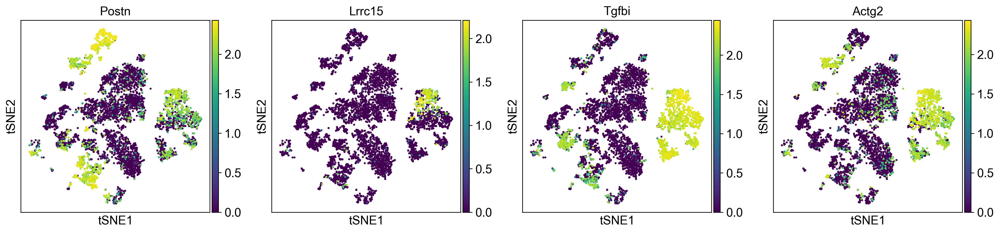

In [136]:
sc.pl.tsne(adata, color=['Postn', 'Lrrc15', 'Tgfbi', 'Actg2'], save='Late vs P1+P7 down.png')

#### P1+P7 ASMs

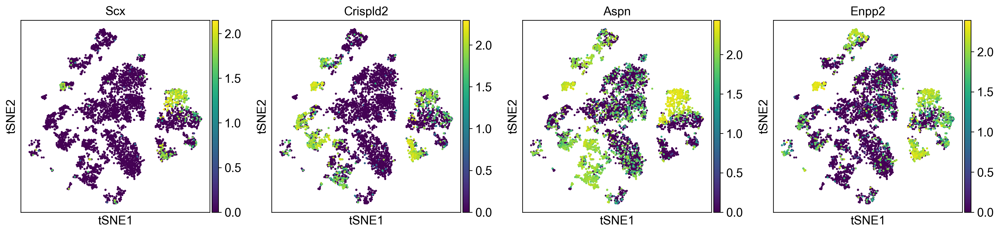

In [151]:
sc.pl.tsne(adata, color=['Scx', 'Crispld2', 'Aspn', 'Enpp2'], save='P1+P7 up.png')

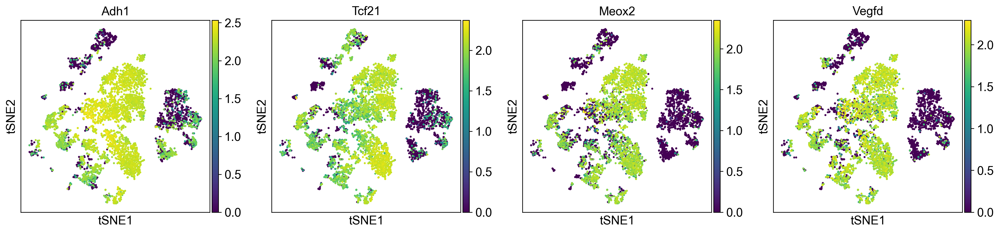

In [155]:
sc.pl.tsne(adata, color=['Adh1', 'Tcf21', 'Meox2', 'Vegfd'], save='P1+P7 down.png')

#### Transition from P1+P7 ASMs to precursor ASMs

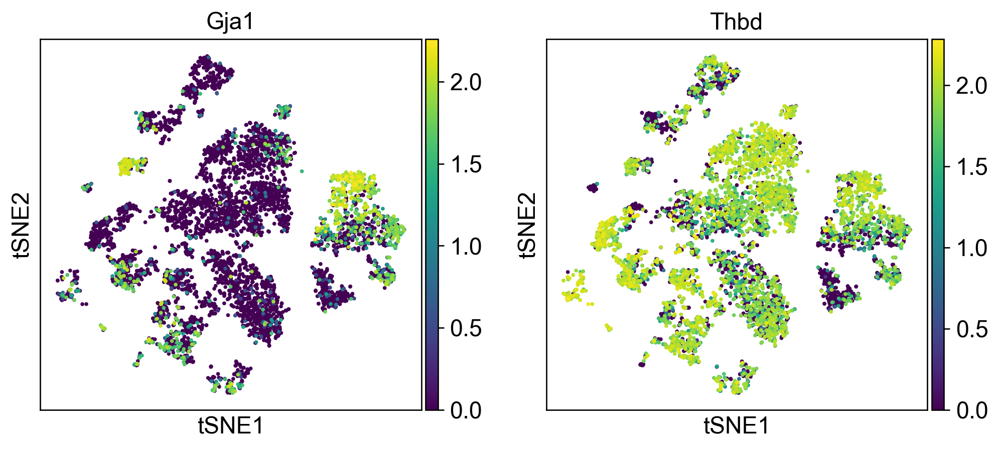

In [157]:
sc.pl.tsne(adata, color=['Gja1', 'Thbd'], save='P1+P7 vs pre up.png')

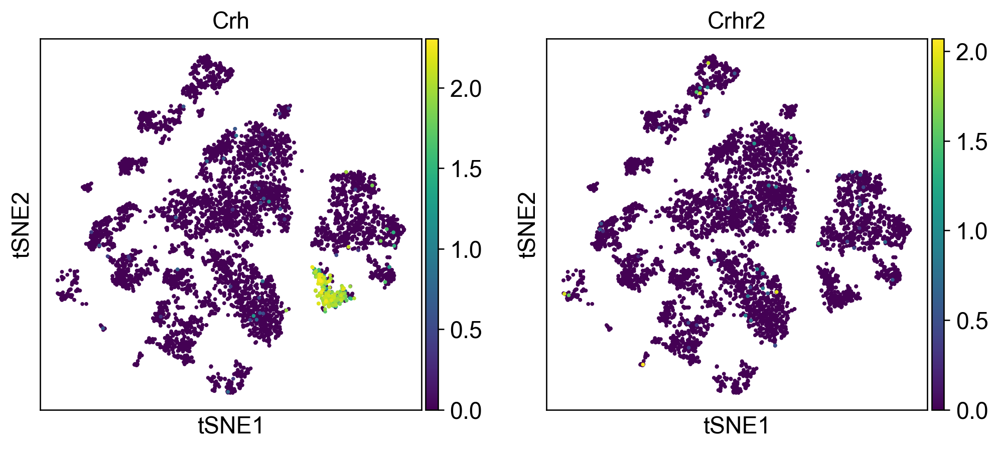

In [166]:
sc.pl.tsne(adata, color=['Crh', 'Crhr2'])

#### Precursor ASMs

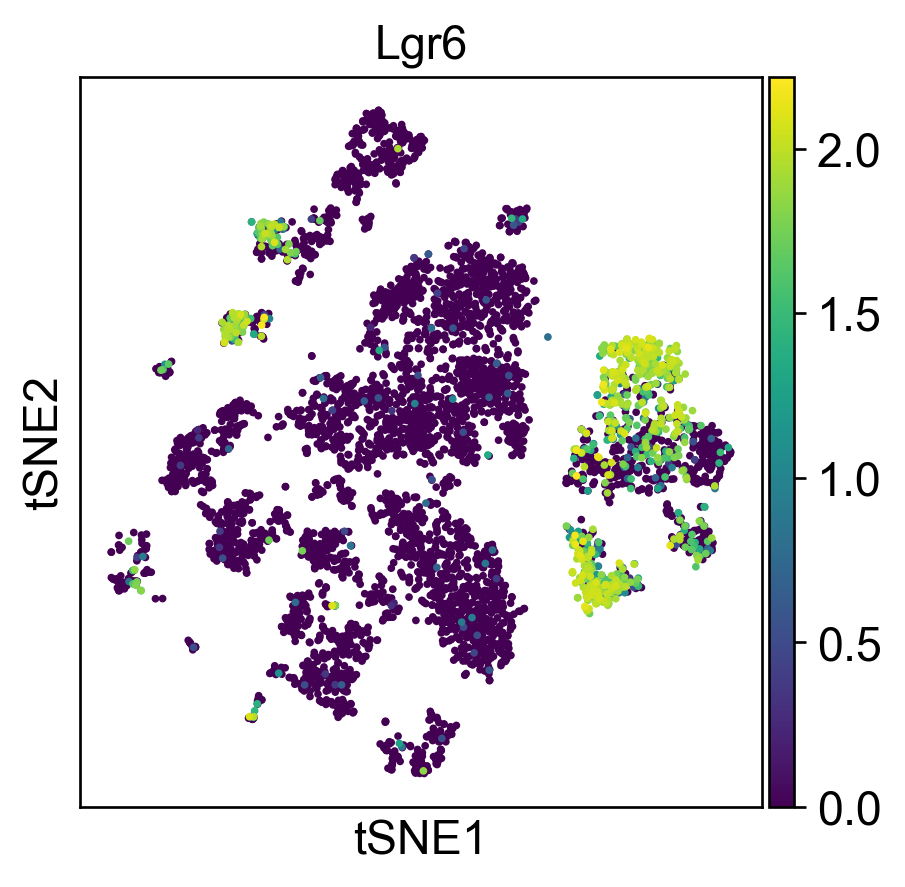

In [159]:
sc.pl.tsne(adata, color='Lgr6', save='Pre up.png')

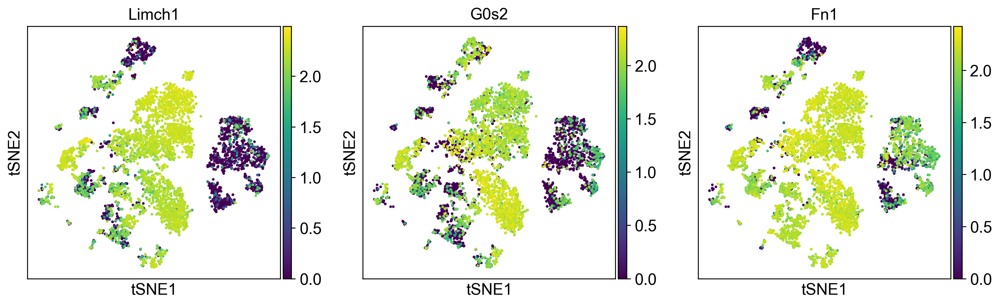

In [164]:
sc.pl.tsne(adata, color=['Limch1', 'G0s2', 'Fn1'], save='Pre down.png')

In [93]:
genes=['Enpp2', 'Lpar1', 'Lpar6', 'Sec61a1', 'Sec61a2', 'Sec61b', 'Sec61g', 'Furin', 'Pcsk6']
df= adata.obs[['Timepoint', 'cellSubtype', 'Treatment']].copy()
for gene in genes:
    df[gene]=adata[:, gene].X

In [94]:
df
idx=df['Treatment']=='normal'
dfn=df.loc[idx]
dfn

,Timepoint,cellSubtype,Treatment,Enpp2,Lpar1,Lpar6,Sec61a1,Sec61a2,Sec61b,Sec61g,Furin,Pcsk6
F_P7_normal_mesench_1_DC20_A1,P7,Airway SMC,normal,1.886727,2.034578,1.899362,1.808735,0.000000,1.741959,1.286041,0.000000,0.0
F_P7_normal_mesench_1_DC20_K8,P7,Airway SMC,normal,0.519392,1.838786,0.000000,1.980793,0.000000,1.906781,1.242001,1.602415,0.0
F_P7_normal_mesench_2_DC20_L3,P7,Early postnatal myofibroblast,normal,0.000000,2.043813,0.000000,1.924758,2.021133,0.000000,0.000000,0.000000,0.0
F_P7_normal_mesench_1_DC20_B3,P7,Airway SMC,normal,2.085642,2.097879,0.000000,1.489463,1.360716,1.770866,1.484192,1.066390,0.0
F_P7_normal_mesench_1_DC20_J23,P7,Col13a1+ matrix fibroblast,normal,0.000000,1.502313,0.831149,0.000000,0.000000,1.833882,0.831149,2.082206,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
M_E18.5_normal_mesench_1_DC35_N21,E18.5,Embryonic G0s2 matrix fibroblast,normal,0.000000,0.910650,0.000000,1.723964,0.000000,1.999364,0.000000,1.304608,0.0
M_P7_normal_mesench_2_DC35_J4,P7,Early postnatal myofibroblast,normal,0.000000,1.725478,0.000000,0.000000,0.000000,1.821710,1.676767,1.119447,0.0
M_P7_normal_mesench_2_DC35_I21,P7,Col13a1+ matrix fibroblast,normal,0.000000,0.000000,0.000000,0.000000,0.000000,1.960730,0.890688,0.546445,0.0
M_P1_normal_mesench_1_DC35_M23,P1,Col13a1+ matrix fibroblast,normal,0.000000,0.000000,1.885323,1.814005,1.948728,1.858652,1.278689,1.500415,0.0


In [95]:
dfa=dfn.groupby(['cellSubtype']).mean()

In [48]:
dfa

,Enpp2,Lpar1,Lpar6,Sec61a1,Sec61a2,Sec61b,Sec61g
cellSubtype,,,,,,,
Airway SMC,1.654962,1.654014,0.279759,1.469127,0.293947,1.487947,1.015656
Col13a1+ matrix fibroblast,0.138427,0.890918,0.326536,1.431693,0.583097,1.708972,1.114722
Col14a1+ fibroblast,0.095002,1.319764,0.341464,1.521696,0.485057,1.600809,1.106274
Early Limch1+ Col13a1- Col14a1- cells,0.045062,0.389561,0.137987,0.514727,0.186527,1.221091,0.858158
Early postnatal myofibroblast,0.492161,1.031698,0.325441,1.279786,0.399013,1.481388,1.120631
Embryonic G0s2 matrix fibroblast,0.118708,1.339323,0.370621,1.219435,0.966052,1.598120,1.077883
Embryonic MyoF and SMC precursors,1.768554,0.400530,0.321906,1.257559,0.603027,1.276901,0.910280
Late myofibroblast,0.242521,1.478096,0.174375,1.679820,0.303634,1.509433,0.913620
Late myofibroflast II,0.329843,0.846394,0.253001,1.106524,0.371496,0.944478,0.525407


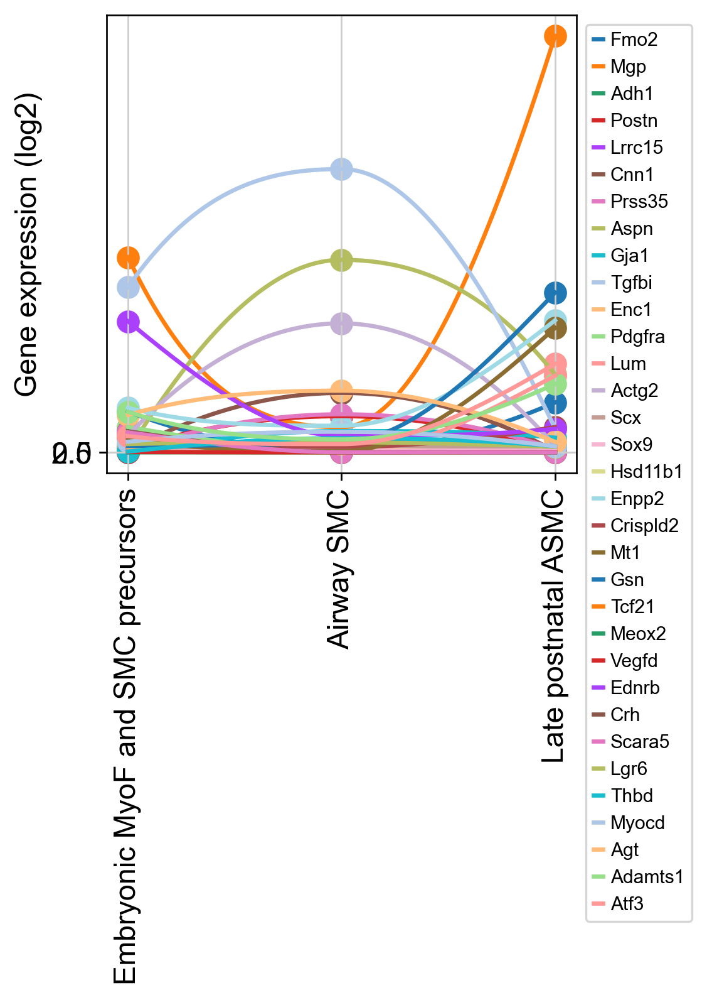

In [14]:
import matplotlib.pyplot as plt
import scipy
#from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,AutoMinorLocator)

cts=['Embryonic MyoF and SMC precursors', 'Airway SMC', 'Late postnatal ASMC']
dfplot=dfa.loc[cts]
x=[0, 1, 2]
x_int=np.linspace(0,2,500)

fig1, ax=plt.subplots()
for gene in genes:
    y=dfplot[gene]
    #ax.plot(x, y, label=gene)
    y_int=scipy.interpolate.pchip_interpolate(x,y,x_int)
    ax.plot(x_int, y_int, label=gene, linewidth=2)
    ax.scatter(x, y, s=100)

ax.set_xticks(x)
ax.set_xticklabels(cts, rotation=90)
ax.set_ylabel('Gene expression (log2)')
ax.legend(loc='upper left', ncol=1, fontsize=9, bbox_to_anchor=(1,1), bbox_transform=ax.transAxes)
ax.set_yticks([0, 2.5])
#ax.yaxis.set_major_locator(MultipleLocator(2))
#ax.yaxis.set_major_formatter(FormatStrFormatter('%d'))

#plt.savefig('Gene expression.png', bbox_inches = "tight")

Text(0.5, 1.0, 'Gene expression')

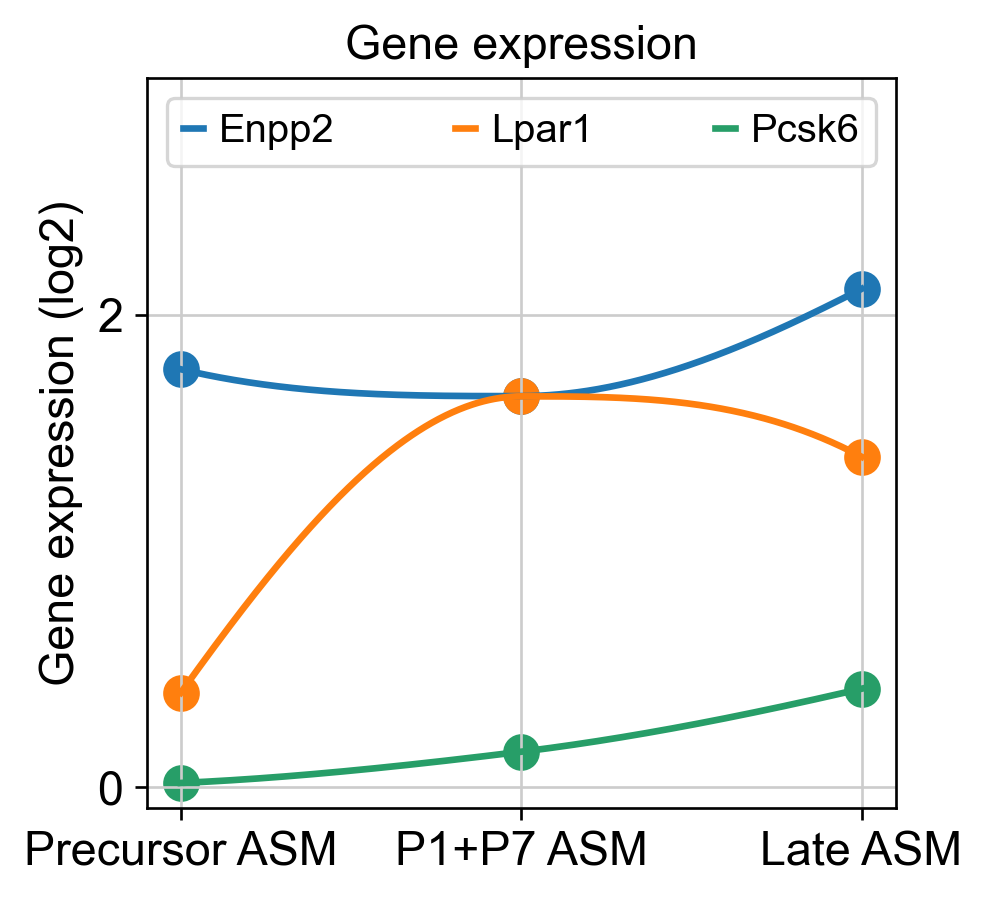

In [100]:
cts=['Embryonic MyoF and SMC precursors', 'Airway SMC', 'Late postnatal ASMC']
dfplot=dfa.loc[cts]
x=[0, 1, 2]
x_int=np.linspace(0,2,500)
genes_down=['Enpp2', 'Lpar1',  'Pcsk6']

fig2, ax=plt.subplots()
for gene in genes_down:
    y=dfplot[gene]
#ax.plot(x, y, label=gene)
    y_int=scipy.interpolate.pchip_interpolate(x,y,x_int)
    ax.plot(x_int, y_int, label=gene, linewidth=2)
    ax.scatter(x, y, s=100)

ax.set_xticks(x)
ax.set_xticklabels(['Precursor ASM', 'P1+P7 ASM', 'Late ASM'])
ax.set_ylabel('Gene expression (log2)')
ax.legend(loc=0, fontsize=12, mode='expand', ncol=4)
ax.set_yticks([0, 3])
ax.yaxis.set_major_locator(MultipleLocator(2))
ax.yaxis.set_major_formatter(FormatStrFormatter('%d'))
ax.set_title('Gene expression')

#plt.savefig('Gene expression up pre', bbox_inches = "tight")

In [8]:
sc.pp.log1p(adata)

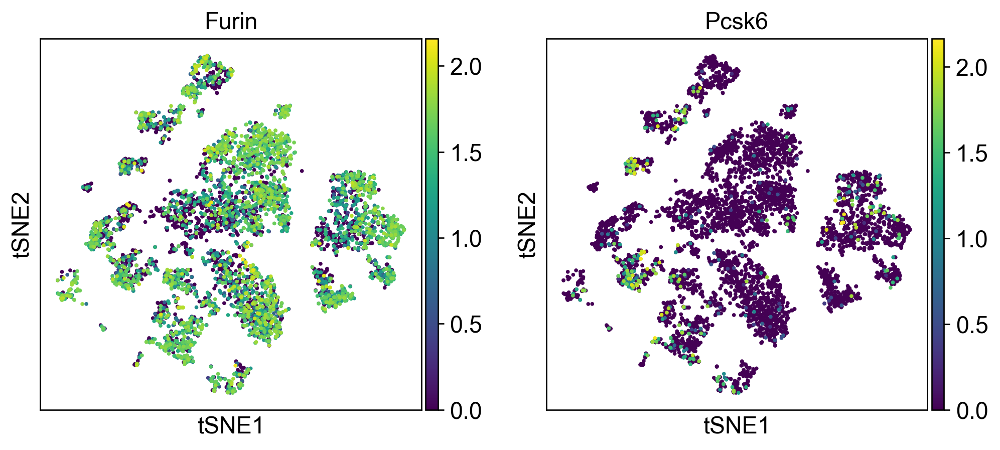

In [102]:
sc.pl.tsne(adata, color=['Furin', 'Pcsk6'], save='Furin and PAce4 expression.png')

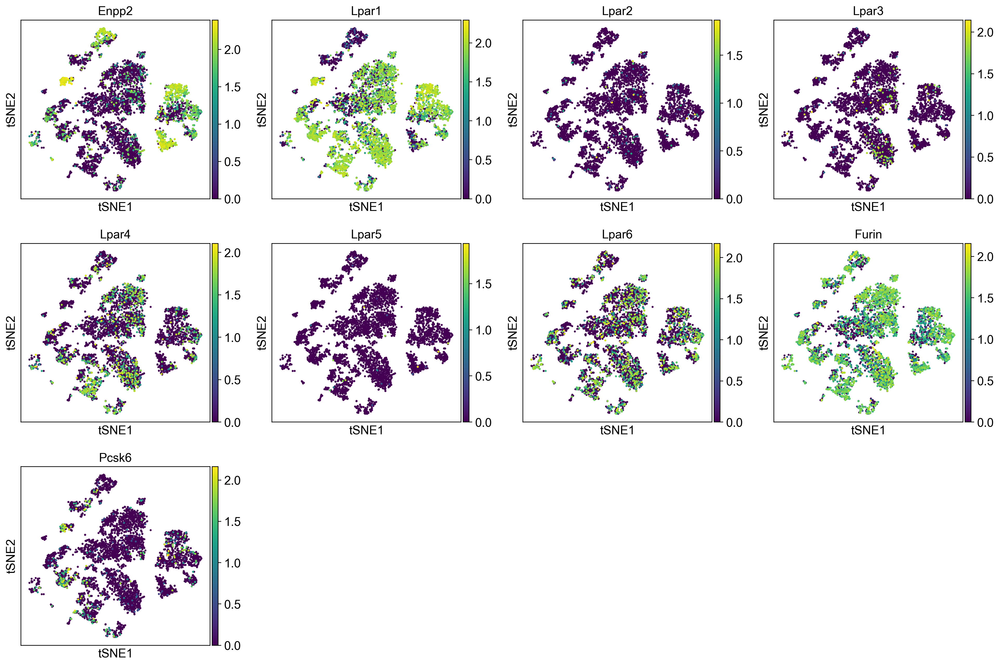

In [98]:
sc.pl.tsne(adata, color=['Enpp2', 'Lpar1', 'Lpar2', 'Lpar3', 'Lpar4', 'Lpar5', 'Lpar6', 'Furin', 'Pcsk6'])

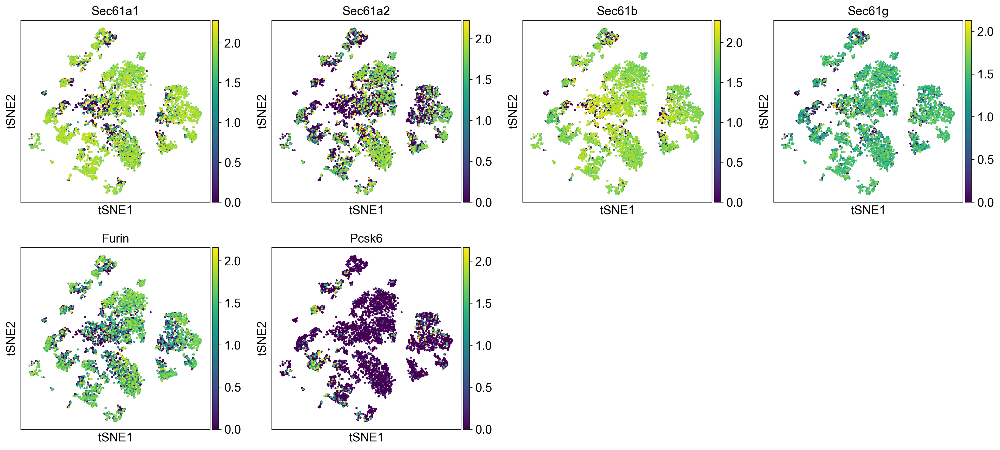

In [91]:
sc.pl.tsne(adata, color=['Sec61a1', 'Sec61a2', 'Sec61b', 'Sec61g', 'Furin', 'Pcsk6'])

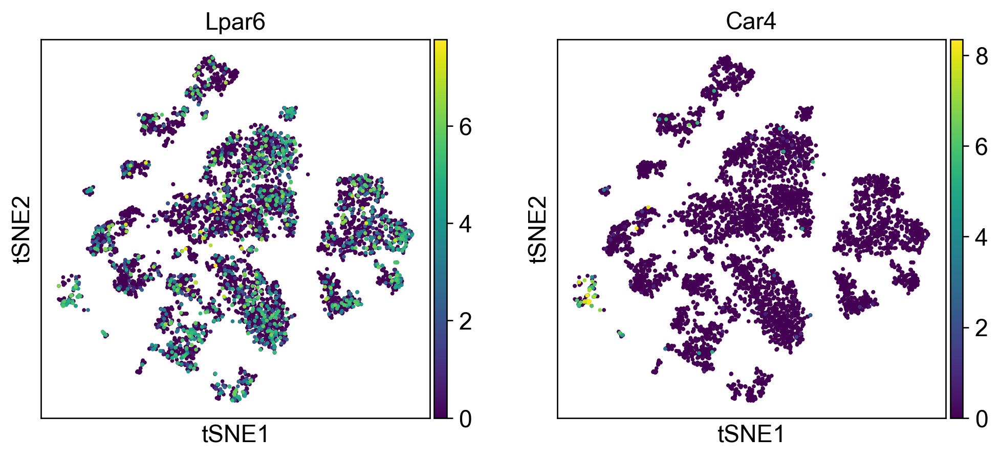

In [9]:
sc.pl.tsne(adata, color=['Lpar6', 'Car4'])

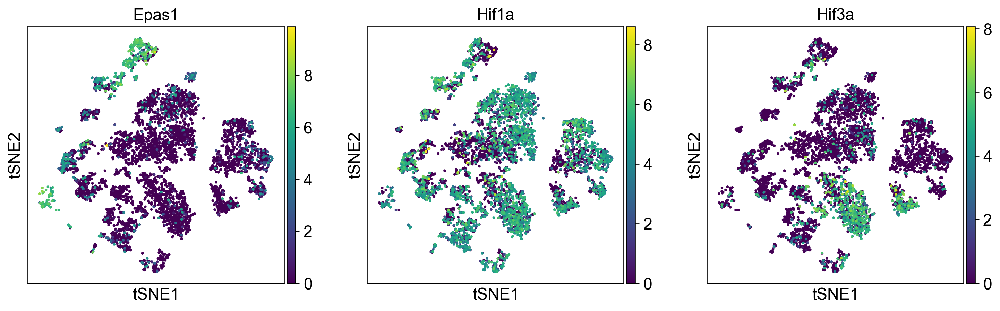

In [11]:
sc.pl.tsne(adata, color=['Epas1', 'Hif1a', 'Hif3a'])

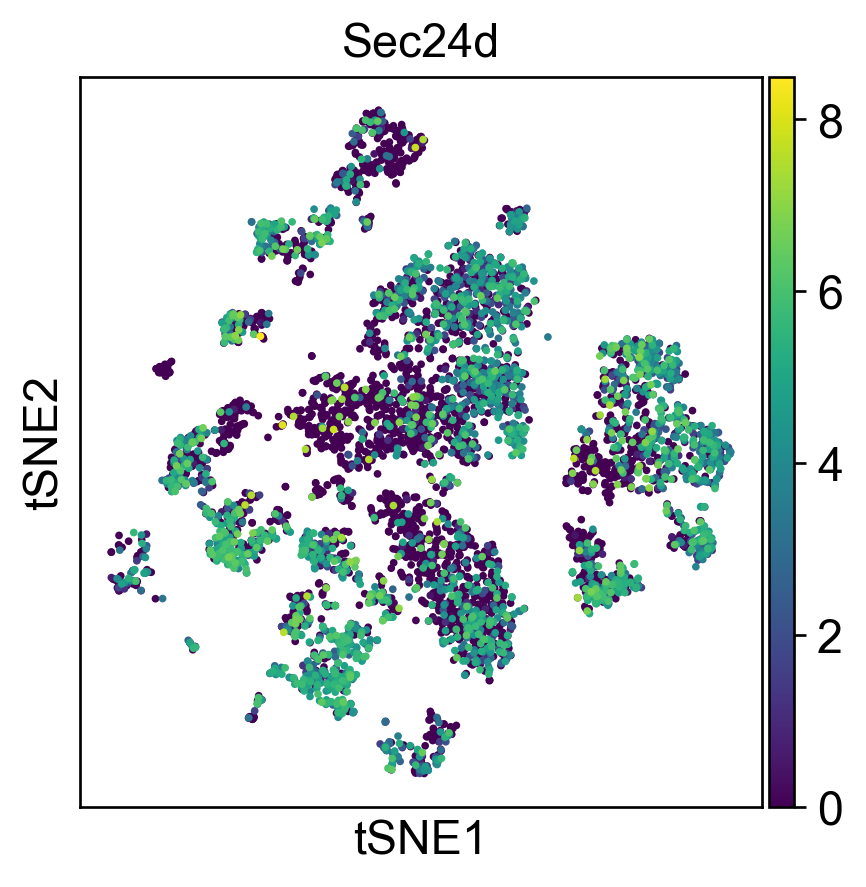

In [14]:
sc.pl.tsne(adata, color='Sec24d')